# BaBar 2008 — D⁰ → Kₛ⁰π⁺π⁻ dependente do tempo

Modelo de amplitude da seção III B-C, Eqs. (7-15) e Tabelas I-II de
[BaBar, Phys. Rev. D 78, 034023 (2008), arXiv:0804.2089](https://arxiv.org/pdf/0804.2089):
oito ondas P/D, duas ondas S Kπ e a onda S ππ K-matrix. A parte temporal segue a mesma estrutura
do notebook `belle_2014_d0_kspipi_time_dependent.ipynb`, com `TimeDependentFitSession` e as
Eqs. (1-2) de Belle PRD 89, 091103 (2014), sem CP direto.

**Status: as fit fractions da Tabela II são reproduzidas dentro das incertezas publicadas.**
As convenções que o artigo não fixa sozinho vêm da tese de Y. P. Lau (Princeton 2007,
[SLAC-R-872](https://digital.library.unt.edu/ark:/67531/metadc901707/), ref. [42] do artigo) e do
modelo `EvtD0mixDalitz` do [EvtGen](https://gitlab.cern.ch/evtgen/evtgen), cujos coeficientes são
os da Tabela II; ver [revisão numérica](../../docs/reviews/babar_2008_model.md).

Os valores injetados de x,y são os medidos pelo BaBar com este modelo
([PRL 105, 081803 (2010), arXiv:1004.5053](https://arxiv.org/abs/1004.5053)).
Não há dados, eficiência, background ou resolução experimental neste notebook.

Convenção de coordenadas: filhas `(K(S)0, pi+, pi-)`, portanto
s₁₂ = m²(Kₛπ⁺), s₁₃ = m²(Kₛπ⁻), s₂₃ = m²(π⁺π⁻).

In [1]:
import os
import sys
from pathlib import Path
from dataclasses import dataclass, replace
os.environ["JAX_PLATFORMS"] = "cpu" # cpu, cuda, tpu

for root in (Path.cwd(), *Path.cwd().parents):
    if (root / "src" / "dalitzplotfitter").is_dir():
        sys.path.insert(0, str(root / "src"))
        break

import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import display
pd.set_option("display.max_columns", None)
from dalitzplotfitter import (
    DecayChannel, DecayModel, GooFitLegacyAngular, KMatrix, Minimizer,
    NeutralMesonMixing, Parameter, PhaseSpaceSample, RealImag,
    RelativisticBreitWigner, Resonance, SquareDalitzGrid,
    TimeDependentDalitzNLL, TimeDependentFitSession, ZemachP, plot_contour,
)
from dalitzplotfitter.dynamics.lineshape.common import breakup_momentum, energy_dependent_width

GRID_RESOLUTION = int(os.environ.get("BABAR_GRID_RESOLUTION", "300"))
TIME_ORDER = 48
TIME_MAX_PS = 4.0
ASIMOV_EVENTS = 100_000
TRUTH = {"mix.x": 0.0016, "mix.y": 0.0057}  # BaBar 2010, arXiv:1004.5053
TAU_PS = 0.4103
CHANNEL = DecayChannel("D0", ("K(S)0", "pi+", "pi-"))
print("JAX:", jax.default_backend(), "x64:", jax.config.x64_enabled)
print("massas [GeV]:", CHANNEL.parent_mass, CHANNEL.daughter_masses)

JAX: cpu x64: True
massas [GeV]: 1.8648399999999998 (0.49761099999999997, 0.13957039000000002, 0.13957039000000002)


## Entradas publicadas

Tabela II: magnitudes, fases em graus e FF em fração. K*(892) (seção III C) e K₀*(1430) (Tabela II)
usam as massas/larguras do artigo; as demais são PDG 2006, e K*(1680) usa a medida LASS K⁻π⁺n
(1677/205 MeV, ref. [38]), como na Tab. 4.5 da tese e no EvtGen.

A ordem do par define os rótulos (A, B) do fator de spin: A é o primeiro índice. Com a correção CLEO
da nota [34] do artigo, A = Kₛ para os K*∓ e A = π⁺ para os estados π⁺π⁻.
Os limites de 95% CL dos dois estados DCS ficam separados das medidas centrais.

In [2]:
# name, pair (A, B), spin, magnitude, phase_deg, mass_GeV, width_GeV, FF_BaBar
SPECS = [
    ("Kstar892_minus",   (0, 2), 1, 1.740, 139.0, .89361, .04634, .557),
    ("K0star1430_minus", (0, 2), 0, 8.2,   153.0, 1.463,  .233,   .102),
    ("K2star1430_minus", (0, 2), 2, 1.410, 138.4, 1.4256, .0985,  .022),
    ("Kstar1680_minus",  (0, 2), 1, 1.46, -174.0, 1.677,  .205,   .007),
    ("Kstar892_plus",    (0, 1), 1, .158, -42.7,  .89361, .04634, .0046),
    ("K0star1430_plus",  (0, 1), 0, .32,  143.0,  1.463,  .233,   np.nan),
    ("K2star1430_plus",  (0, 1), 2, .091,  85.0,  1.4256, .0985,  np.nan),
    ("rho770",           (1, 2), 1, 1.,     0.,   .7758,  .1464,  .210),
    ("omega782",         (1, 2), 1, .0527, 126.5, .78259, .00849, .009),
    ("f2_1270",          (1, 2), 2, .606,  157.4, 1.2754, .1851,  .006),
]
REFERENCE_FF = {row[0]: row[-1] for row in SPECS}
REFERENCE_FF["pipi_S"] = .119
FF_UPPER_LIMITS = {"K0star1430_plus": .0005, "K2star1430_plus": .0012}
FF_ERRORS = dict(zip(
    ["Kstar892_minus", "K0star1430_minus", "K2star1430_minus", "Kstar1680_minus",
     "Kstar892_plus", "rho770", "omega782", "f2_1270", "pipi_S"],
    [.028, .015, .016, .019, .0023, .016, .010, .007, .026],
))
BARRIER_RADIUS = 1.5  # resonance vertex (Sec. III B)
PARENT_RADIUS = 0.0   # F_D = 1: Lau Sec. 4.5.1 and EvtGen default f_b = 0

def polar(magnitude, phase_deg):
    return magnitude * np.exp(1j * np.deg2rad(phase_deg))

def coefficient(magnitude, phase_deg):
    z = polar(magnitude, phase_deg)
    return RealImag(z.real, z.imag)

display(pd.DataFrame(SPECS, columns=[
    "component", "pair", "spin", "magnitude", "phase_deg", "mass", "width", "FF_BaBar"
]))

,component,pair,spin,magnitude,phase_deg,mass,width,FF_BaBar
0,Kstar892_minus,"(0, 2)",1,1.7400,139.0,0.89361,0.04634,0.5570
1,K0star1430_minus,"(0, 2)",0,8.2000,153.0,1.46300,0.23300,0.1020
2,K2star1430_minus,"(0, 2)",2,1.4100,138.4,1.42560,0.09850,0.0220
3,Kstar1680_minus,"(0, 2)",1,1.4600,-174.0,1.67700,0.20500,0.0070
4,Kstar892_plus,"(0, 1)",1,0.1580,-42.7,0.89361,0.04634,0.0046
5,K0star1430_plus,"(0, 1)",0,0.3200,143.0,1.46300,0.23300,NaN
6,K2star1430_plus,"(0, 1)",2,0.0910,85.0,1.42560,0.09850,NaN
7,rho770,"(1, 2)",1,1.0000,0.0,0.77580,0.14640,0.2100
8,omega782,"(1, 2)",1,0.0527,126.5,0.78259,0.00849,0.0090
9,f2_1270,"(1, 2)",2,0.6060,157.4,1.27540,0.18510,0.0060


## Dinâmica: onda S Kπ, Gounaris-Sakurai, K-matrix e fatores de spin

**Onda S Kπ (Eqs. 14-15).** Forma de `EvtDalitzReso::lass`, com φ_R só no exponencial
(a Eq. 14 impressa o põe também no seno, o que dá FF(K₀*⁻) ≈ 18% em vez de 10%):
A = F sin δ_F e^{iδ_F} + R sin δ_R⁰ e^{i(δ_R⁰+φ_R)} e^{2iδ_F}, com δ_R⁰ = atan[MΓ(m)/(M²−m²)],
δ_F = φ_F + cot⁻¹(1/(aq) + rq/2). O q é o momento de quebra de Kπ (tese de Lau, Eq. 3.56).
Sem fator m/q e sem corte em massa.

**ρ(770).** Gounaris-Sakurai com −i√s Γ(s) no denominador, como no EvtGen.

**K-matrix.** Constantes de espalhamento da Tabela I e produção da Tabela II
(f′₁ᵥ = f₁ᵥ/f₁₁, s₀^prod = −0.07); só o quinto polo/canal de produção é desligado.

**Spin e barreiras.** Fatores invariantes da tese de Lau (Eq. 3.21): Z₁ = 4pq cos θ_AC,
Z₂ = (16/3)p²q²(3cos²θ_AC − 1), isto é, `GooFitLegacyAngular`. F_r é Blatt-Weisskopf normalizado no polo
com R = 1,5 GeV⁻¹ e F_D = 1.

In [3]:
@dataclass(frozen=True)
class BaBarLASS:
    """BaBar 2008 Kpi S-wave, Eqs. (14-15), as implemented by EvtDalitzReso::lass."""
    F: float = .80
    phi_F: float = 2.33
    R: float = 1.0
    phi_R: float = -5.31
    a: float = 1.07
    r: float = -1.8

    def __call__(self, mass, context):
        m = jnp.asarray(mass)
        m0 = context.pole_mass
        m1, m2 = context.daughter_masses
        q = breakup_momentum(m, m1, m2)
        gamma = energy_dependent_width(m, context)  # Gamma0 (q/q0) (M/m) for L=0
        delta_F = self.phi_F + jnp.arctan2(self.a * q, 1 + .5 * self.a * self.r * q**2)
        delta_R0 = jnp.arctan2(m0 * gamma, m0**2 - m**2)
        nonresonant = self.F * jnp.sin(delta_F) * jnp.exp(1j * delta_F)
        resonant = self.R * jnp.sin(delta_R0) * jnp.exp(1j * (delta_R0 + self.phi_R + 2 * delta_F))
        return nonresonant + resonant


@dataclass(frozen=True)
class BaBarGounarisSakurai:
    """Gounaris-Sakurai with -i sqrt(s) Gamma(s), as EvtDalitzReso::propGounarisSakurai."""

    def __call__(self, mass, context):
        m = jnp.asarray(mass)
        m0, gamma0 = context.pole_mass, context.pole_width
        mpi = context.daughter_masses[0]
        k = breakup_momentum(m, mpi, mpi)
        k0 = breakup_momentum(jnp.asarray(m0), mpi, mpi)
        h = lambda x, kx: 2 / jnp.pi * kx / x * jnp.log((x + 2 * kx) / (2 * mpi))
        dh = h(m0, k0) * (.125 / k0**2 - .5 / m0**2) + .5 / (jnp.pi * m0**2)
        f = gamma0 * m0**2 / k0**3 * (k**2 * (h(m, k) - h(m0, k0)) + (m0**2 - m**2) * k0**2 * dh)
        d = (3 / jnp.pi * mpi**2 / k0**2 * jnp.log((m0 + 2 * k0) / (2 * mpi))
             + m0 / (2 * jnp.pi * k0) - mpi**2 * m0 / (jnp.pi * k0**3))
        width = energy_dependent_width(m, context)
        return (1 + d * gamma0 / m0) / (m0**2 - m**2 + f - 1j * m * width)

KPI_SWAVE = BaBarLASS()
RHO_LINESHAPE = BaBarGounarisSakurai()
f11_prod = polar(7.94, 73.9)
PIPI_SWAVE = KMatrix(
    betas=(polar(9.3, -78.7), polar(10.89, -159.1), polar(24.2, 168.0), polar(9.16, 90.5), 0j),
    f_prod=(f11_prod, f11_prod * polar(2.0, -18.0), f11_prod * polar(5.1, 33.0),
            f11_prod * polar(3.23, 4.8), 0j),
    s0_prod=-0.07,
)

In [4]:
resonances = [
    Resonance(name, pair, coefficient(mag, phase),
              lineshape=(KPI_SWAVE if spin == 0 else
                         RHO_LINESHAPE if name == "rho770" else RelativisticBreitWigner()),
              angular=GooFitLegacyAngular(), mass=mass, width=width, spin=spin,
              resonance_radius=BARRIER_RADIUS, parent_radius=PARENT_RADIUS,
              normalize_component=False, normalize_form_factors=True,
              bachelor_momentum_frame="parent")
    for name, pair, spin, mag, phase, mass, width, _ in SPECS
]
resonances.append(Resonance(
    "pipi_S", (1,2), RealImag(1,0), lineshape=PIPI_SWAVE, angular=ZemachP(),
    mass=1., width=0., spin=0, normalize_component=False,
))
# `model` uses the default (gauss-legendre) normalization and is reused below
# by generate_toy(); TimeDependentFitSession derives Abar(s12,s13)=A(s13,s12)
# automatically (no-direct-CPV convention).
model = DecayModel(CHANNEL, resonances, normalize_components=False)
A_COMPONENTS = tuple(model.amplitude_model.components)

def build_session(resolution):
    # Same resonances as `model`, normalized on an explicit SquareDalitzGrid.
    # times/tags are placeholders: this session is only used for its cache
    # (FF audit, Dalitz plot); the Asimov/toy sections build their own.
    grid = SquareDalitzGrid(CHANNEL.parent_mass, CHANNEL.daughter_masses,
                           resolution=resolution, pair=(1,2)).sample()
    grid_model = DecayModel(CHANNEL, resonances, normalize_components=False,
                            normalization_sample=grid)
    session = TimeDependentFitSession(
        grid_model, grid, times=jnp.zeros(grid.size), tags=jnp.ones(grid.size),
        mixing=NeutralMesonMixing(TRUTH["mix.x"], TRUTH["mix.y"], TAU_PS),
    )
    return grid, session

grid, session = build_session(GRID_RESOLUTION)
N_A = session.n_particle_components
GROUPS = jnp.stack((jnp.arange(2*N_A)<N_A, jnp.arange(2*N_A)>=N_A), axis=1)
assert N_A == 11
cache = session.cache
amplitudes, overlap = cache.coherent_groups({}, GROUPS)
assert np.isfinite(np.asarray(amplitudes)).all()
print("Componentes por sabor:", N_A, "pontos DP:", grid.size)
print("Overlap A/Abar:", np.asarray(overlap))

Componentes por sabor: 11 pontos DP: 90000
Overlap A/Abar: [[609.80612677-5.68434189e-14j  49.77437743-1.77635684e-14j]
 [ 49.77437743+1.77635684e-14j 609.80612677+0.00000000e+00j]]


## Fit fractions e convergência

FFs de t=0, sem aceitação, calculadas por c†Mc (Eq. 10 do artigo). A tabela BaBar serve como alvo,
não como condição de normalização. Os erros publicados são dominados por sistemáticas; o pull usa esse
erro total, sem correlações. A coluna de convergência (grade 2x) separa discretização de convenção.

In [5]:
def fractions_and_total(prepared):
    matrix = prepared.normalization_matrix({})[:N_A, :N_A]
    coefficients = prepared.coefficient_vector({})[:N_A]
    total = jnp.real(jnp.vdot(coefficients, matrix @ coefficients))
    return np.asarray(jnp.abs(coefficients)**2 * jnp.real(jnp.diag(matrix)) / total), float(total)

ff, total = fractions_and_total(cache)
fine_grid, fine_session = build_session(2*GRID_RESOLUTION)
fine_cache = fine_session.cache
ff_fine, total_fine = fractions_and_total(fine_cache)
names = [c.name for c in A_COMPONENTS]
ff_table = pd.DataFrame({
    "component": names,
    "FF local [%]": 100*ff,
    "FF grid 2x [%]": 100*ff_fine,
    "BaBar [%]": [100*REFERENCE_FF[n] for n in names],
    "limite 95% CL [%]": [100*FF_UPPER_LIMITS.get(n, np.nan) for n in names],
    "erro BaBar [pp]": [100*FF_ERRORS.get(n, np.nan) for n in names],
})
ff_table["pull"] = (ff_table["FF grid 2x [%]"] - ff_table["BaBar [%]"]) / ff_table["erro BaBar [pp]"]
display(ff_table)
measured = ff_table["pull"].notna()
limited = ff_table["limite 95% CL [%]"].notna()
print("Mudança relativa da integral:", total_fine/total-1)
print("Máxima mudança FF [pp]:", 100*np.max(abs(ff_fine-ff)))
print("Soma das FF (grid 2x):", ff_table["FF grid 2x [%]"].sum(), "%  (BaBar: 103,6 +/- 5,2%)")
print(f"chi2 das {measured.sum()} FF medidas: {(ff_table.loc[measured, 'pull']**2).sum():.3f}")
assert (ff_table.loc[measured, "pull"].abs() < 1).all()
assert (ff_table.loc[limited, "FF grid 2x [%]"] < ff_table.loc[limited, "limite 95% CL [%]"]).all()
# Keep the finer grid for subsequent diagnostics and fit.
grid, cache = fine_grid, fine_cache
amplitudes, overlap = cache.coherent_groups({}, GROUPS)
del fine_grid, fine_cache, fine_session

,component,FF local [%],FF grid 2x [%],BaBar [%],limite 95% CL [%],erro BaBar [pp],pull
0,Kstar892_minus,56.234020,56.163549,55.70,NaN,2.80,0.165553
1,K0star1430_minus,9.823715,9.811404,10.20,NaN,1.50,-0.259064
2,K2star1430_minus,2.138173,2.135494,2.20,NaN,1.60,-0.040317
3,Kstar1680_minus,0.711913,0.711021,0.70,NaN,1.90,0.005801
4,Kstar892_plus,0.463676,0.463095,0.46,NaN,0.23,0.013457
5,K0star1430_plus,0.014961,0.014942,NaN,0.05,NaN,NaN
6,K2star1430_plus,0.008906,0.008895,NaN,0.12,NaN,NaN
7,rho770,20.286208,20.260786,21.00,NaN,1.60,-0.462009
8,omega782,0.995183,0.900791,0.90,NaN,1.00,0.000791
9,f2_1270,0.540945,0.540267,0.60,NaN,0.70,-0.085333


Mudança relativa da integral: 0.0012547483087306244
Máxima mudança FF [pp]: 0.09439202481300052
Soma das FF (grid 2x): 102.91424732800708 %  (BaBar: 103,6 +/- 5,2%)
chi2 das 9 FF medidas: 0.317


INFO DalitzPlotFitter normalization: narrow resonance band(s) detected (m23: m0=0.782590 GeV, Gamma=8.490 MeV); using adaptive Gauss-Legendre normalization.


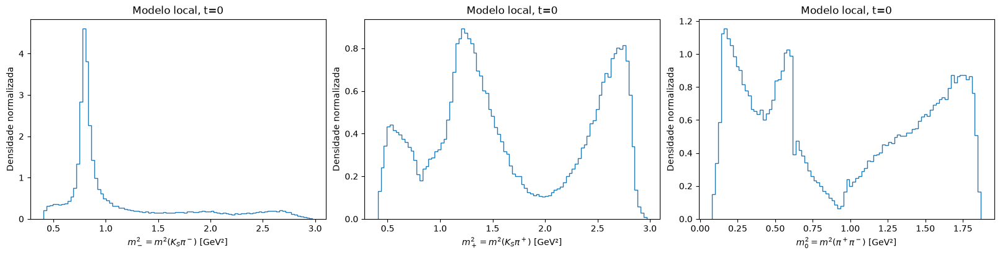

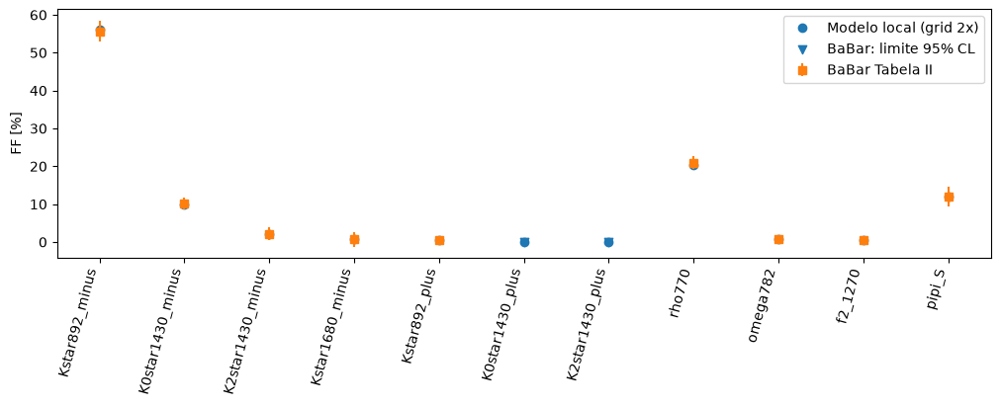

In [6]:
from dalitzplotfitter import generate_toy

# SquareDalitzGrid points are a fixed (m', theta') quadrature lattice, NOT an
# i.i.d. sample: histogramming them directly aliases against the bin edges
# (whole grid rows collapse into single s12/s23 values, producing a comb
# pattern). Draw a genuine random toy from the t=0 model instead and
# histogram that; residual bin-to-bin noise is then ordinary Poisson
# statistics, not a grid artifact. accept-reject is used here (not the
# default inverse-transform) as the slower, exact reference sampler,
# appropriate for a diagnostic plot rather than repeated large-N generation.
PROJECTION_TOY_SIZE = 100_000
projection_toy = generate_toy(
    model, PROJECTION_TOY_SIZE, method="accept-reject", seed=1, include_momenta=False,
)

# Same order as Fig. 6(a-c) of the paper: m-^2 = s13, m+^2 = s12, m0^2 = s23.
fig, axes = plt.subplots(1, 3, figsize=(16,4), constrained_layout=True)
for ax, key, title in zip(axes, ("s13", "s12", "s23"),
                          (r"$m_-^2 = m^2(K_S\pi^-)$", r"$m_+^2 = m^2(K_S\pi^+)$",
                           r"$m_0^2 = m^2(\pi^+\pi^-)$")):
    ax.hist(np.asarray(getattr(projection_toy, key)), bins=90,
            histtype="step", density=True)
    ax.set(xlabel=title+" [GeV²]", ylabel="Densidade normalizada", title="Modelo local, t=0")
plt.show()
fig, ax = plt.subplots(figsize=(10,4), constrained_layout=True)
x = np.arange(N_A)
ax.plot(x, 100*ff_fine, "o", label="Modelo local (grid 2x)")
ax.errorbar(x, ff_table["BaBar [%]"], yerr=ff_table["erro BaBar [pp]"], fmt="s", label="BaBar Tabela II")
limits = ff_table["limite 95% CL [%]"].to_numpy()
ax.scatter(x[np.isfinite(limits)], limits[np.isfinite(limits)], marker="v", label="BaBar: limite 95% CL")
ax.set_xticks(x, ff_table.component, rotation=75, ha="right")
ax.set_ylabel("FF [%]"); ax.legend(); plt.show()

## Dalitz bidimensional do modelo

Densidade coerente em **t=0**, normalizada no Dalitz completo, para D⁰ e D̄⁰.
Sem folding, eficiência ou background. Os dois painéis usam a mesma escala
logarítmica; valores abaixo de 10⁻⁵ do máximo saturam na cor inferior.
A curva preta delimita a região física. Sem CP direto, os painéis se relacionam
pela troca dos eixos. São previsões do modelo, não dados BaBar.

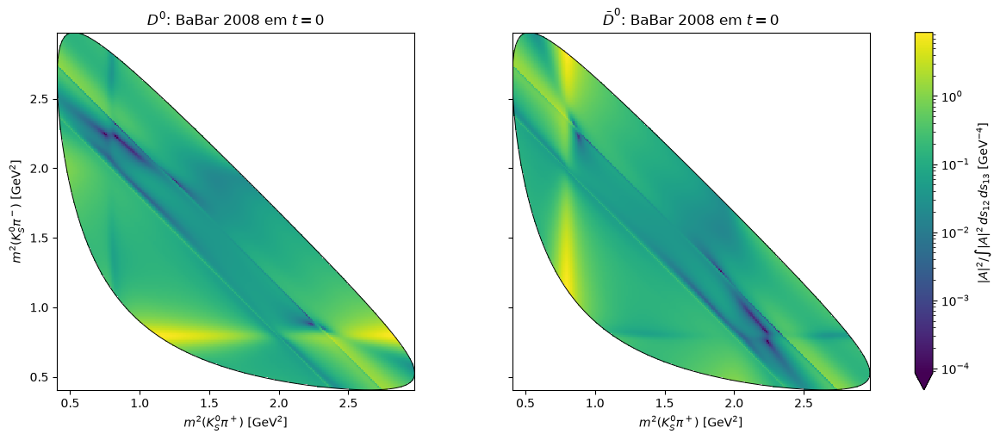

In [7]:
from matplotlib.colors import LogNorm
from dalitzplotfitter import dalitz_s13_limits

# Evaluate the intensity on a uniform invariant-mass-squared mesh.
# No quadrature weights here: pixel colour is PDF density, not grid occupancy.
DALITZ_PIXELS = 260
m1, m2, m3 = CHANNEL.daughter_masses
M = CHANNEL.parent_mass
s12_edges = np.linspace((m1+m2)**2, (M-m3)**2, DALITZ_PIXELS+1)
s13_edges = np.linspace((m1+m3)**2, (M-m2)**2, DALITZ_PIXELS+1)
s12_centers = (s12_edges[:-1]+s12_edges[1:])/2
s13_centers = (s13_edges[:-1]+s13_edges[1:])/2
xx, yy = np.meshgrid(s12_centers, s13_centers)
ylo, yhi = dalitz_s13_limits(jnp.asarray(xx), mother_mass=M,
                             masses=CHANNEL.daughter_masses)
physical = (yy > np.asarray(ylo)) & (yy < np.asarray(yhi))
plot_data = {
    "s12": jnp.asarray(xx[physical]),
    "s13": jnp.asarray(yy[physical]),
    "s23": jnp.asarray(M**2+m1**2+m2**2+m3**2-xx[physical]-yy[physical]),
}

def _coherent(data):
    amplitude = jnp.zeros(data["s12"].shape, dtype=jnp.complex128)
    for component in A_COMPONENTS:
        amplitude = amplitude + component.value(data)
    return amplitude

# No-direct-CPV convention (TimeDependentFitSession's default, used above):
# Abar(s12,s13) = A(s13,s12), so D0bar is just A_COMPONENTS evaluated on the
# swapped invariants -- no separate ABAR_COMPONENTS list needed here.
reflected_data = {"s12": plot_data["s13"], "s13": plot_data["s12"], "s23": plot_data["s23"]}
plot_amplitudes = [np.asarray(_coherent(plot_data)), np.asarray(_coherent(reflected_data))]

# Full coherent, t=0 normalization; no efficiency or backgrounds.
plot_overlap = np.asarray(cache.coherent_groups({}, GROUPS)[1])
dalitz_densities = []
for flavour, amplitude in enumerate(plot_amplitudes):
    density = np.full(xx.shape, np.nan)
    density[physical] = np.abs(amplitude)**2 / plot_overlap[flavour, flavour].real
    dalitz_densities.append(density)
assert all(np.isfinite(d[physical]).all() for d in dalitz_densities)
# No-direct-CPV model: reflected densities must agree on the symmetric mesh.
np.testing.assert_allclose(dalitz_densities[0], dalitz_densities[1].T,
                           rtol=1e-8, atol=1e-10, equal_nan=True)

vmax = max(np.nanmax(d) for d in dalitz_densities)
colour_norm = LogNorm(vmin=vmax*1e-5, vmax=vmax)
fig_dalitz, axes_dalitz = plt.subplots(1, 2, figsize=(12, 5),
                                      sharex=True, sharey=True, constrained_layout=True)
boundary_x = np.linspace(s12_edges[0], s12_edges[-1], 1000)
boundary_low, boundary_high = dalitz_s13_limits(
    jnp.asarray(boundary_x), mother_mass=M, masses=CHANNEL.daughter_masses)
for ax, density, label in zip(axes_dalitz, dalitz_densities, (r"$D^0$", r"$\bar D^0$")):
    mesh = ax.pcolormesh(s12_edges, s13_edges, np.ma.masked_invalid(density),
                         cmap="viridis", norm=colour_norm, shading="flat", rasterized=True)
    ax.plot(boundary_x, boundary_low, color="black", lw=.7)
    ax.plot(boundary_x, boundary_high, color="black", lw=.7)
    ax.set(xlabel=r"$m^2(K_S^0\pi^+)$ [GeV$^2$]",
           title=label+": BaBar 2008 em $t=0$")
    ax.set_aspect("equal")
axes_dalitz[0].set_ylabel(r"$m^2(K_S^0\pi^-)$ [GeV$^2$]")
fig_dalitz.colorbar(mesh, ax=axes_dalitz, extend="min",
                    label=r"$|A|^2 / \int |A|^2\,ds_{12}\,ds_{13}$ [GeV$^{-4}$]")
plt.show()

## Reprodução das equações temporais

Comparação pontual contra as equações publicadas, escritas independentemente em
NumPy. Inclui os dois sabores e q/p complexo. Este teste é independente da
concordância das fit fractions.

In [8]:
def paper_rate(t, a, b, x, y, tau, ratio=1+0j):
    u = np.asarray(t)/tau
    cross = ratio*np.asarray(b)*np.conj(a)
    return np.exp(-u)/2*(
        (abs(a)**2+abs(ratio*b)**2)*np.cosh(y*u)
        +(abs(a)**2-abs(ratio*b)**2)*np.cos(x*u)
        +2*cross.real*np.sinh(y*u)-2*cross.imag*np.sin(x*u))

probe_times = np.array([0., .1, .4, 1., 2.])
a, b = complex(amplitudes[grid.size//3,0]), complex(amplitudes[grid.size//3,1])
ratio = .9*np.exp(-1j*np.deg2rad(6.))
mixing_probe = NeutralMesonMixing(TRUTH["mix.x"], TRUTH["mix.y"], TAU_PS, .9, np.angle(ratio))
k = np.asarray(mixing_probe.basis(probe_times, {}))
for aa, bb, rr in [(a,b,ratio),(b,a,1/ratio)]:
    cross = rr*bb*np.conj(aa)
    actual = k[:,0]*abs(aa)**2+k[:,1]*abs(rr*bb)**2+2*(k[:,2]*cross.real-k[:,3]*cross.imag)
    expected = paper_rate(probe_times, aa, bb, *TRUTH.values(), TAU_PS, rr)
    np.testing.assert_allclose(actual, expected, rtol=1e-11, atol=1e-12)
print("Equações Belle (1–2): OK para ambos os sabores")

Equações Belle (1–2): OK para ambos os sabores


## Fit Asimov de x,y — fechamento do modelo local

Amplitudes fixas, CP conservado, aceitação unitária e resolução perfeita.
Pesos Asimov são gerados pelas equações NumPy, com medida DP × dt e normalização
separada por sabor. Ajustamos a partir de valores distintos da verdade.
O número equivalente de eventos controla a Hessiana, não transforma estes pontos
em dados experimentais. A distribuição discreta aproxima a integração contínua.

In [9]:
time_nodes, time_weights = np.polynomial.legendre.leggauss(TIME_ORDER)
time_nodes = TIME_MAX_PS*(time_nodes+1)/2
time_weights = TIME_MAX_PS*time_weights/2
# Bound memory for the Asimov example: use the original grid order, audited above.
asimov_grid, asimov_session = build_session(GRID_RESOLUTION)
asimov_base = asimov_session.cache
amp_asimov, _ = asimov_base.coherent_groups({}, GROUPS)
a, b = np.asarray(amp_asimov).T
measure = time_weights[:,None]*np.asarray(asimov_grid.weights)[None,:]/asimov_grid.size
probabilities = []
for aa, bb in ((a,b),(b,a)):
    rate = paper_rate(time_nodes[:,None], aa, bb, *TRUTH.values(), TAU_PS)
    p = rate*measure
    probabilities.append(.5*p/p.sum())
asimov_weights = jnp.asarray(ASIMOV_EVENTS*np.stack(probabilities).ravel())
tag_id, time_id, dp_id = np.indices((2, TIME_ORDER, asimov_grid.size)).reshape(3,-1)
asimov_cache = replace(asimov_base, data_components=asimov_base.data_components[dp_id])
x = Parameter("mix.x", .02, bounds=(-.1,.1), step=.001)
y = Parameter("mix.y", -.01, bounds=(-.1,.1), step=.001)
parameters = (x,y)
asimov_cache.check_parameters(parameters)
nll = TimeDependentDalitzNLL(
    asimov_cache, N_A, time_nodes[time_id], 1-2*tag_id,
    NeutralMesonMixing(x,y,TAU_PS), time_range=(0,TIME_MAX_PS),
)
def asimov_objective(values):
    return -jnp.sum(asimov_weights*jnp.log(nll.densities(values)))
result = Minimizer(asimov_objective, parameters).fit(strategy=1, hesse=True)
print(result.fmin)
closure = pd.DataFrame({
    "injetado": TRUTH,
    "ajustado": {p.name: result.values[p.name] for p in parameters},
    "erro Asimov ideal": {p.name: result.errors[p.name] for p in parameters},
})
display(closure)
assert result.valid
np.testing.assert_allclose(closure.ajustado, closure.injetado, atol=3e-6, rtol=0)

/home/juan-leite/Work/DalitzPlotFitter/.venv/lib/python3.12/site-packages/jax/_src/interpreters/mlir.py:1333: UserWarning: A large amount of constants were captured during lowering (3.25GB total). If this is intentional, disable this warning by setting JAX_CAPTURED_CONSTANTS_WARN_BYTES=-1. To obtain a report of where these constants were encountered, set JAX_CAPTURED_CONSTANTS_REPORT_FRAMES=-1.
  warnings.warn(message)


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 3.092e+04                  │         Nfcn = 42, Ngrad = 3         │
│ EDM = 2.31e-08 (Goal: 1e-07)     │           time = 77.6 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘


,injetado,ajustado,erro Asimov ideal
mix.x,0.0016,0.001600,0.003506
mix.y,0.0057,0.005699,0.002919


## Toy de eventos reais e `plot_time_projection`

O fit Asimov acima usa a verdade exata numa grade ponderada (sem ruído
estatístico). Esta célula reamostra um conjunto de eventos **discretos e
reais** a partir da mesma grade de pesos Asimov (reamostragem ponderada,
mesma técnica de `dalitzplotfitter.sampling.weighted_resample`, aplicada
aqui à grade (tag, tempo, DP) já construída acima), roda um fit não-binned
genuíno por evento via `TimeDependentFitSession.fit()` e usa
`session.plot_time_projection()` para sobrepor o histograma de tempo
observado (por tag) à curva exata integrada no Dalitz
(`TimeDependentDalitzNLL.dalitz_integrated_time_pdf`).

O tempo de cada evento vem de um dos `TIME_ORDER` nós de quadratura
Gauss-Legendre — não é uma geração contínua em tempo. Isso é suficiente para
demonstrar `plot_time_projection` com um fit real por evento, mas não é (e
não substitui) um gerador de toy contínuo em tempo; o pacote ainda não tem
um `generate_toy` com dimensão temporal.

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 5944                       │         Nfcn = 45, Ngrad = 3         │
│ EDM = 3.3e-12 (Goal: 1e-07)      │            time = 0.8 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
valid=True  NLL=5944.174143
parameter                           value            error
t

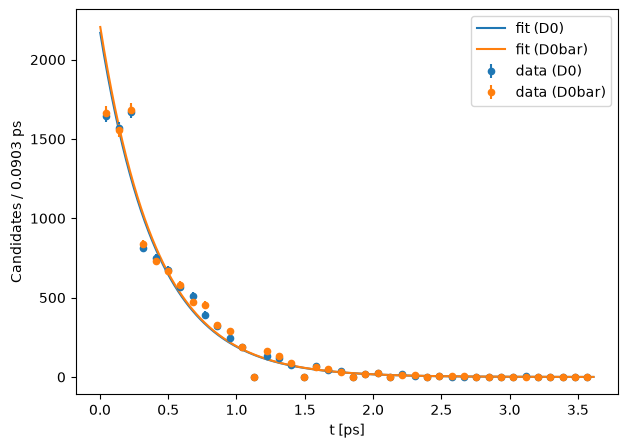

In [10]:
TOY_EVENTS = 20_000
rng = np.random.default_rng(7)
asimov_probabilities = np.asarray(asimov_weights) / float(np.sum(asimov_weights))
chosen = rng.choice(asimov_weights.size, size=TOY_EVENTS, p=asimov_probabilities)
toy_tag_id, toy_time_id, toy_dp_id = tag_id[chosen], time_id[chosen], dp_id[chosen]

toy_data = PhaseSpaceSample(
    s12=jnp.asarray(asimov_grid.s12)[toy_dp_id],
    s13=jnp.asarray(asimov_grid.s13)[toy_dp_id],
    s23=jnp.asarray(asimov_grid.s23)[toy_dp_id],
    weights=jnp.ones(TOY_EVENTS),
)
toy_session = TimeDependentFitSession(
    asimov_session.model, toy_data,
    jnp.asarray(time_nodes[toy_time_id]), jnp.asarray(1 - 2 * toy_tag_id),
    NeutralMesonMixing(
        Parameter("toy.mix.x", .02, bounds=(-.1, .1), step=.001),
        Parameter("toy.mix.y", -.01, bounds=(-.1, .1), step=.001),
        TAU_PS,
    ),
)
toy_result = toy_session.fit(strategy=1, hesse=True)
print(toy_result.fmin)
toy_session.print_result(toy_result)
assert toy_result.valid
toy_session.plot_time_projection(toy_result, bins=40, time_unit="ps")
plt.show()

## Contorno de confiança (x, y)

`plot_contour(result, "toy.mix.x", "toy.mix.y")` é o plot "manchete" desse
tipo de medida — as medidas de mixing publicam exatamente isso (Fig. 4 do Belle 2014, por exemplo): o ponto de
melhor ajuste e os contornos de 68,3%/95%. `toy_result` (o fit real por
evento da célula acima) já tem só esses dois parâmetros soltos, então serve
direto. Os contornos vêm de `Minuit.mncontour` — verossimilhança de perfil
de verdade (reminimiza os outros parâmetros livres em cada ponto do scan),
não a aproximação gaussiana da elipse de covariância.

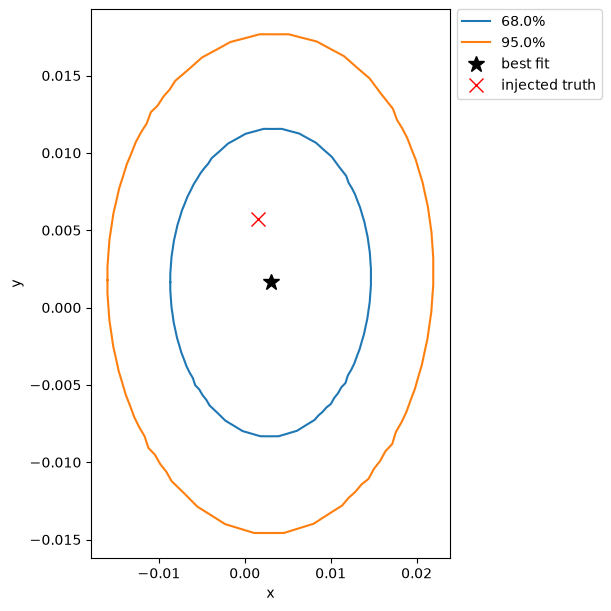

In [11]:
ax_contour = plot_contour(toy_result, "toy.mix.x", "toy.mix.y", cl=(0.68, 0.95))
ax_contour.plot(TRUTH["mix.x"], TRUTH["mix.y"], marker="x", color="red",
               markersize=10, linestyle="none", label="injected truth")
ax_contour.set_xlabel("x")
ax_contour.set_ylabel("y")
# Match plot_contour's own legend placement (outside the axes): calling
# .legend() again with no args here would fall back to matplotlib's "best"
# location, which tends to land back on top of the contours it labels.
ax_contour.legend(loc="upper left", bbox_to_anchor=(1.02, 1.0), borderaxespad=0.0)
plt.show()

## `plot_projection` — Dalitz por tag, integrado no tempo

`session.plot_projection(result, variable)` compara, para cada tag observada
(D⁰ | D̄⁰, um painel cada), o histograma de uma variável do Dalitz contra a
predição do modelo **integrada em tempo** sobre `time_range`
(`TimeDependentDalitzNLL.tag_marginal_density`) — diferente dos gráficos
anteriores (que são em `t=0` ou marginais em tempo). Usa o mesmo toy real
(`toy_session`, `toy_result`) da célula anterior.

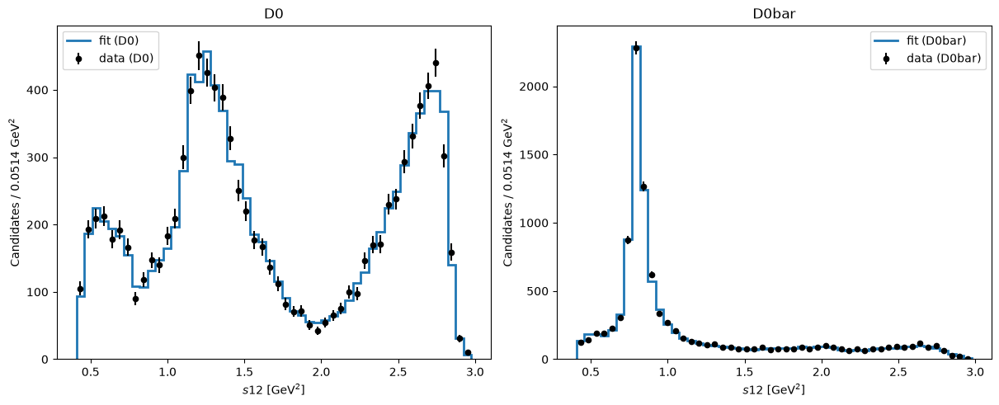

In [12]:
toy_session.plot_projection(toy_result, "s12", bins=50, projection_size=100_000)
plt.show()

## GIF: evolução da forma do Dalitz com t

`TimeDependentDalitzNLL.dalitz_density_at_time(A, Ā, t, params)` dá o
"snapshot" conjunto (Dalitz, tag) em um `t` fixo, normalizado para integrar a
1 no Dalitz **naquele mesmo `t`** — ou seja, remove o decaimento exponencial
trivial em `t` e isola só a **mudança de forma** do Dalitz causada pela
mistura (x faz o D⁰ oscilar pra D̄⁰; y faz os autoestados de massa decaírem
com taxas ligeiramente diferentes). Em `t=0` reduz exatamente a `|A|²/ia`
(mesma normalização da célula "Dalitz bidimensional" acima).

**Aviso:** os valores de x,y medidos pelo BaBar (~0,16% e ~0,57%) tornam essa
mudança de forma imperceptível a olho nu numa janela de tempo realista — o
período de oscilação de x sozinho é ~460 ps, muito maior que os poucos ps
observados; é exatamente por isso que essa medida exige estatística enorme.
Para a animação abaixo, x = 0,6 é **exagerado de propósito** e y = 0, só para tornar
a oscilação de sabor visível — não é uma alegação sobre os valores físicos
ou o resultado do fit. A janela vai de 0 a $10\tau$, quase um período ($2\pi/x \approx 10{,}5\tau$):
o painel do tag D⁰ começa com o Dalitz do D⁰, vira o Dalitz do D̄⁰ em $x t/\tau=\pi$
($\approx 5{,}2\tau$) e volta quase ao do D⁰ no fim (o painel D̄⁰ faz o inverso). Com y = 0 a
inversão é completa, e a célula verifica isso. Com y ≠ 0 os autoestados de massa decaem com
taxas diferentes e a inversão fica incompleta. A animação tem 101 quadros (passos de $0{,}1\tau$) a 4 fps (~25 s).

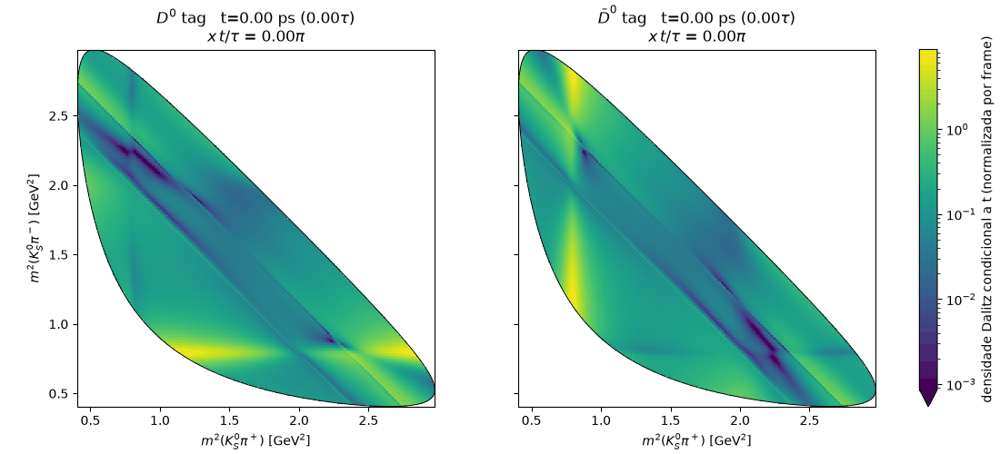

In [17]:
import tempfile

from IPython.display import Image, display
from matplotlib.animation import FuncAnimation, PillowWriter

# Illustration only -- see markdown above: NOT the physical/fitted x,y.
# y = 0 isolates the flavour oscillation: the D0 -> D0bar flip is complete at x t/tau = pi.
DEMO_X = 0.6
DEMO_MIXING = NeutralMesonMixing(DEMO_X, 0.0, TAU_PS)
ANIMATION_TIMES = np.linspace(0.0, 10 * TAU_PS, 101)  # steps of 0.1 tau
FLIP_TIME = np.pi / DEMO_X * TAU_PS                    # x t/tau = pi, ~5.24 tau

# Reuses cache/N_A/GROUPS (the fine grid from the FF audit above) and
# plot_amplitudes/xx/physical/... (the uniform mesh from "Dalitz bidimensional
# do modelo" above); only the mixing kernel is swapped for the demo one.
# times/tags are unused placeholders, same convention as build_session().
demo_nll = TimeDependentDalitzNLL(
    cache, N_A, jnp.zeros(grid.size), jnp.ones(grid.size), DEMO_MIXING,
)

frames_plus, frames_minus = [], []
for t in ANIMATION_TIMES:
    dp, dm = demo_nll.dalitz_density_at_time(
        jnp.asarray(plot_amplitudes[0]), jnp.asarray(plot_amplitudes[1]), float(t), {},
    )
    density_plus = np.full(xx.shape, np.nan)
    density_plus[physical] = np.asarray(dp)
    density_minus = np.full(xx.shape, np.nan)
    density_minus[physical] = np.asarray(dm)
    frames_plus.append(density_plus)
    frames_minus.append(density_minus)

# At x t/tau = pi (y = 0) each tag shows exactly the other flavour's t = 0 Dalitz plot.
flip_plus, flip_minus = demo_nll.dalitz_density_at_time(
    jnp.asarray(plot_amplitudes[0]), jnp.asarray(plot_amplitudes[1]), float(FLIP_TIME), {},
)
np.testing.assert_allclose(np.asarray(flip_plus), frames_minus[0][physical], rtol=1e-6)
np.testing.assert_allclose(np.asarray(flip_minus), frames_plus[0][physical], rtol=1e-6)

# Fixed colour scale across all frames: since each frame is independently
# normalized to integrate to 1 over the Dalitz plane, a fixed scale means
# brightness stays comparable frame to frame, and only the SHAPE moves.
anim_vmax = max(np.nanmax(f) for f in frames_plus + frames_minus)
anim_norm = LogNorm(vmin=anim_vmax * 1e-4, vmax=anim_vmax)
anim_mappable = plt.cm.ScalarMappable(norm=anim_norm, cmap="viridis")

fig_anim, axes_anim = plt.subplots(
    1, 2, figsize=(11, 5), sharex=True, sharey=True, constrained_layout=True,
)
fig_anim.colorbar(
    anim_mappable, ax=axes_anim, extend="min",
    label="densidade Dalitz condicional a t (normalizada por frame)",
)

def draw_frame(i):
    for ax, frame, label in zip(
        axes_anim, (frames_plus[i], frames_minus[i]), (r"$D^0$", r"$\bar D^0$"),
        strict=True,
    ):
        ax.clear()
        ax.pcolormesh(s12_edges, s13_edges, np.ma.masked_invalid(frame),
                     cmap="viridis", norm=anim_norm, shading="flat", rasterized=True)
        ax.plot(boundary_x, boundary_low, color="black", lw=.7)
        ax.plot(boundary_x, boundary_high, color="black", lw=.7)
        t_ps, t_tau = ANIMATION_TIMES[i], ANIMATION_TIMES[i] / TAU_PS
        ax.set_title(f"{label} tag   t={t_ps:.2f} ps ({t_tau:.2f}" + r"$\tau$)"
                     + f"\n" + r"$x\,t/\tau$" + f" = {DEMO_X * t_tau / np.pi:.2f}" + r"$\pi$")
        ax.set_xlabel(r"$m^2(K_S^0\pi^+)$ [GeV$^2$]")
        ax.set_aspect("equal")
    axes_anim[0].set_ylabel(r"$m^2(K_S^0\pi^-)$ [GeV$^2$]")
    return axes_anim

anim = FuncAnimation(fig_anim, draw_frame, frames=len(ANIMATION_TIMES), interval=250)
with tempfile.NamedTemporaryFile(suffix=".gif") as tmp:
    anim.save(tmp.name, writer=PillowWriter(fps=4))
    tmp.seek(0)
    gif_bytes = tmp.read()
plt.close(fig_anim)
display(Image(data=gif_bytes, format="gif"))

## Reprodução da Tabela II

Com as convenções acima, as nove fit fractions medidas da Tabela II ficam dentro dos erros publicados
e os dois estados DCS ficam abaixo dos limites de 95% CL (a célula de auditoria verifica isso com `assert`).
Nenhum coeficiente foi reajustado. As mudanças que fecharam a reprodução, em relação à implementação
anterior, foram convenções com fonte explícita:

| Convenção | Antes | Agora | Fonte |
|---|---|---|---|
| Fator de spin | `ZemachP` (−2pq cos θ) | Z₁ = 4pq cos θ, Z₂ = (16/3)p²q²(3cos²θ−1) | Lau Eq. 3.21 |
| Sinal spin 1 | pares mistos | correção CLEO, A = Kₛ / π⁺ | nota [34], EvtGen |
| Barreiras | primadas cruas | normalizadas no polo, F_D = 1 | Lau Tab. 3.1, Sec. 4.5.1 |
| φ_R na onda S Kπ | dentro do seno | só no exponencial | `EvtDalitzReso::lass` |
| K*(1680) | 1717/322 MeV | 1677/205 MeV (LASS) | artigo ref. [38] |

Detalhes e o estudo de cada convenção: [revisão numérica](../../docs/reviews/babar_2008_model.md).

## Limites

1. **F_D.** O texto da seção III B menciona barreira no vértice do D com R = 1,5 GeV⁻¹; a tese e o EvtGen
   usam F_D = 1. As FF favorecem ligeiramente F_D = 1, mas não excluem a outra leitura.
2. **Coeficientes.** A Tabela II arredonda magnitudes e fases a três algarismos.
3. **Parte temporal.** O Asimov e o toy têm aceitação unitária, resolução perfeita e nenhum background
   ou mistag. O BaBar 2010 ajustou 540 mil eventos com resolução temporal e backgrounds; os erros daqui
   não são comparáveis aos publicados. τ(D⁰) = 0,4103 ps, o mesmo valor do notebook do Belle.

O núcleo suporta aceitação temporal fatorizada e resolução gaussiana via
quadratura (ver `docs/time_dependent.md`).